# Table of Contents



1. [Setup and Configuration](#setup-and-configuration)
  1. [Environment setup](#environment-setup)
  2. [Directories](#directories)

2. [Data layer](#data-layer)
      1. [Data generation](#data-generation)
      2. [Data processing](#data-processing)
      3. [Instance segmentation](#instance-segmentation)

3. [AI layer](#ai-layer)
      1. [Training](#ai-training)
      2. [Validation](#ai-validation)
      3. [Inference](#ai-inference)

4. [Evaluation](#evaluation)

5. [Compilation](#compilation)



## 1. Setup and Configuration <a name="setup-and-configuration"></a>


#### Environment setup <a name="environment-setup"></a>

**1.1 Loading data from google drive or upload the zip provided**

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


- **Copy files, if not present make the directory**

In [10]:
import os
try:
  cp -r /content/drive/MyDrive/ai_project /content/ai_project
except:
  os.mkdir("/content/ai_project/")
  os.mkdir("/content/ai_project/runs")

#### Directories <a name="directories"></a>

**1.2 Setting up directories**

- **Set a timestamp for training new files, keep timestamp as "1712486411" for running on existing file.**

In [ ]:
import time
# timestamp = int(time.time())
timestamp =1712486411
print(timestamp)

1712486411


- **Providing directory paths to variables**




In [ ]:
import os

current_run_path = os.path.join('/content/ai_project/runs', str(timestamp))

current_run_path_run_screenshot = os.path.join(current_run_path, "run_screenshot")

current_run_path_place_screenshot = os.path.join(current_run_path, "place_screenshot")

current_run_path_place_screenshot_marker = os.path.join(current_run_path, "place_screenshot_marker")

current_run_path_satellite_images = os.path.join(current_run_path, "satellite_images")

current_run_path_satellite_images_marker = os.path.join(current_run_path, "satellite_images_marker")

current_run_path_train = os.path.join(current_run_path, "train")

current_run_path_val = os.path.join(current_run_path, "val")

current_run_path_test = os.path.join(current_run_path, "test")

current_run_path_test_output = os.path.join(current_run_path, "test_output")

current_run_path_test_output_combined = os.path.join(current_run_path, "test_output_combined")

current_run_path_model = os.path.join(current_run_path, "model")

- **Making folder for paths if not created**

In [ ]:
if not os.path.exists(current_run_path):
  os.makedirs(current_run_path)
if not os.path.exists(current_run_path_run_screenshot):
  os.makedirs(current_run_path_run_screenshot)
if not os.path.exists(current_run_path_place_screenshot):
  os.makedirs(current_run_path_place_screenshot)
if not os.path.exists(current_run_path_place_screenshot_marker):
  os.makedirs(current_run_path_place_screenshot_marker)
if not os.path.exists(current_run_path_satellite_images):
  os.makedirs(current_run_path_satellite_images)
if not os.path.exists(current_run_path_satellite_images_marker):
  os.makedirs(current_run_path_satellite_images_marker)
if not os.path.exists(current_run_path_train):
  os.makedirs(current_run_path_train)
if not os.path.exists(current_run_path_val):
  os.makedirs(current_run_path_val)
if not os.path.exists(current_run_path_test):
  os.makedirs(current_run_path_test)
if not os.path.exists(current_run_path_test_output):
  os.makedirs(current_run_path_test_output)
if not os.path.exists(current_run_path_test_output_combined):
  os.makedirs(current_run_path_test_output_combined)
if not os.path.exists(current_run_path_model):
  os.makedirs(current_run_path_model)

## 2. Data layer <a name="data-layer"></a>



#### 2.1 Data generation <a name="data-generation"></a>

- **Creating a dataframe for training files, contains names of buildings from Aberdeen City. Either use this or upload a file with column- "name" in case you want train for a new data.**

In [ ]:
import pandas as pd
data_train = {
    'name': ['torry medical practice, aberdeen train_1.png',
             "king's pavilion, aberdeen train_1.png",
             'aberdeen sports village, aberdeen train_1.png',
             'edward wright building, aberdeen train_1.png',
             'harlaw academy, aberdeen train_1.png',
             'lidl, king street, aberdeen train_1.png',
             'south house, aberdeen train_1.png',
             'aberdeen science centre, aberdeen train_1.png',
             'asda aberdeen beach train_1.png',
             'jump in adventure park, aberdeen train_1.png',
             'maritime and coastguard agency, aberdeen train_1.png',
             "st mary's building, university of aberdeen train_1.png"]

}
df_train = pd.DataFrame(data_train)
df_train['data'] = 'train'

- **Creating a dataframe for test files, contains names of buildings from random cities.**

In [ ]:
import pandas as pd
data_test = {
    'name': [
            'Ainslie Park Leisure Centre, Edinburgh test_1.png',
            'Aviemore Kart Raceway, Aviemore test_1.png',
            'Murrayburn Primary School, Edinburgh test_1.png',
            'St Andrews Golf Company Ltd., Leven test_1.png',
            'Brewsterwells Crematorium Ltd, Leven test_1.png',
            'arden court, inverness test_1.png',
            'Dark Trinity Art Tattoo Studio, Aviemore test_1.png',
            'UPS, 30 S Gyle Cres, Edinburgh test_1.png',
            'Jewson Aberdeen, Aberdeen test_1.png',
            'Bristow, HM Coastguard SAR, Inverness test_1.png',
            'Millburn Academy, Inverness test_1.png',
            'screwfix inverness, inverness test_1.png',
            'parcelforce worldwide, inverness test_1.png',
            'Booker Glasgow, Glasgow test_1.png',
            'bp, Dunnottar Ave, Stonehaven test_1.png',
            'A Ritchie, 107 Rosehill Dr, Aberdeen test_1.png',
            'Robroyston Retail Park, Glasgow test_1.png',
            'Pilton Youth & Children_s Project, Edinburgh test_1.png',
            'Foxnose, Partick, Glasgow test_1.png',
            'Flowers With Flair, Aberdeen test_1.png',
            'Sterling Home, Aberdeen test_1.png',
            'String Sports, Glasgow test_1.png',
            'Tesco Petrol Station, Dores Rd, Inverness test_1.png',
            'OVO Hydro, Glasgow test_1.png',
            'D M Forklifts, Lyndon, Stonehaven test_1.png',
            'Banchory Academy, Banchory test_1.png',
            'East Sands Leisure Centre, St Andrews test_1.png',
            'Clyde Auto Repairs, Glasgow test_1.png',
            'IKEA Edinburgh, Costkea Way test_1.png',
            'Bridge of Don Country Club, Glashieburn test_1.png',
            'The Seafood Ristorante, St Andrews test_1.png',
            'Nucore Group, Aberdeen test_1.png'
            ]
}
df_test = pd.DataFrame(data_test)
df_test['data'] = 'test'


- **Concating the data**

In [ ]:
df = pd.concat([df_train, df_test], ignore_index=True)
df.to_csv(os.path.join(current_run_path, "google_earth_search.csv"))
df.head(3)

,name,data
0,"torry medical practice, aberdeen train_1.png",train
1,"king's pavilion, aberdeen train_1.png",train
2,"aberdeen sports village, aberdeen train_1.png",train


- **Install required packages for selenium RPA**

In [ ]:
!apt-get update
!apt-get install -y xvfb
!pip install pyvirtualdisplay selenium

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:4 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Get:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [825 kB]
Get:6 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Get:8 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,371 kB]
Hit:9 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [2,037 kB]
0% [12 Packages 1,442 kB/2,03

- **Use Robotic Process Automation (RPA) to extract satellite images from Google Earth**

Code for image extraction using the places datframe- google_earth_search.csv

In [ ]:
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.common.by import By
from time import sleep
from IPython.display import Image
from selenium.webdriver.common.action_chains import ActionChains
import subprocess

chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument('--start-maximized')
chrome_options.add_argument('--window-size=1280,720')
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')

# Set up the virtual display (Xvfb)
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1280, 720))
display.start()

driver = webdriver.Chrome(options=chrome_options)
action_chains = ActionChains(driver)

# Open Google Earth webpage
sleep(2)
driver.get("https://earth.google.com/")
window_size = driver.get_window_rect()
print(window_size)
driver.set_window_size(1280, 720)
print(window_size)
initial_position = driver.execute_script("return [window.pageXOffset, window.pageYOffset];")
print(initial_position)


# Wait for the page to load
sleep(5)
driver.save_screenshot(os.path.join(current_run_path_run_screenshot, '1_load_page.png'))
sleep(2)
driver.find_element(By.XPATH, "//*").send_keys(Keys.ESCAPE)
sleep(2)
driver.save_screenshot(os.path.join(current_run_path_run_screenshot, '2_click_esc.png'))
sleep(2)


driver.find_element(By.XPATH, "//*").send_keys(Keys.CONTROL + 'b')
sleep(5)
driver.save_screenshot(os.path.join(current_run_path_run_screenshot, '3_click_layers.png'))
sleep(2)
action_chains.move_by_offset(473, 381).click().perform() #clean
sleep(5)
driver.save_screenshot(os.path.join(current_run_path_run_screenshot, '4_click_layers_clean.png'))
sleep(2)
action_chains.move_by_offset(-473, -381).perform()
sleep(2)

for x in range(len(df)):
  place = df['name'][x]
  print(x, place)
  sleep(2)
  driver.find_element(By.TAG_NAME, "body").send_keys('/')
  sleep(2)
  driver.save_screenshot(os.path.join(current_run_path_run_screenshot, '5_click_search.png'))
  sleep(5)
  driver.find_element(By.TAG_NAME, "body").send_keys(Keys.CONTROL + 'a')
  sleep(1)
  driver.find_element(By.TAG_NAME, "body").send_keys(Keys.BACKSPACE)
  sleep(1)
  driver.find_element(By.TAG_NAME, "body").send_keys(place)
  sleep(1)
  driver.find_element(By.TAG_NAME, "body").send_keys(Keys.ENTER)
  sleep(10)
  if df['data'][x] == 'train':
    driver.save_screenshot(os.path.join(current_run_path_place_screenshot_marker, place + ' train_1.png'))
  elif df['data'][x] == 'test':
    driver.save_screenshot(os.path.join(current_run_path_place_screenshot_marker, place + ' test_1.png'))
  sleep(1)
  driver.find_element(By.TAG_NAME, "body").send_keys(Keys.ESCAPE)
  sleep(2)
  if df['data'][x] == 'train':
    driver.save_screenshot(os.path.join(current_run_path_place_screenshot, place + ' train_1.png'))
  elif df['data'][x] == 'test':
    driver.save_screenshot(os.path.join(current_run_path_place_screenshot, place + ' test_1.png'))
driver.quit()
display.stop()

{'height': 720, 'width': 1280, 'x': 0, 'y': 0}
{'height': 720, 'width': 1280, 'x': 0, 'y': 0}
[0, 0]
0 south house, aberdeen
1 Bristow, HM Coastguard SAR, Inverness
2 bp, Dunnottar Ave, Stonehaven
3 D M Forklifts, Lyndon, Stonehaven
4 Banchory Academy, Banchory
5 The Seafood Ristorante, St Andrews
6 East Sands Leisure Centre, St Andrews
7 Brewsterwells Crematorium Ltd, Leven
8 St Andrews Golf Company Ltd., Leven
9 UPS, 30 S Gyle Cres, Edinburgh
10 Murrayburn Primary School, Edinburgh
11 Dark Trinity Art Tattoo Studio, Aviemore
12 Aviemore Kart Raceway, Aviemore
13 Foxnose, Partick, Glasgow
14 Clyde Auto Repairs, Glasgow


### 2.2 Data processing <a name="data-processing"></a>

- **Installing pytesseract dependency**

In [ ]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 45 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (3,586 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

- **Doing OCR on the images recieved to extract scale and co-ordinate(location) information.**

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import pytesseract
import re


df12= pd.DataFrame()
df_name = []
df_scale = []
df_location = []


for image_path in os.listdir(current_run_path_place_screenshot):
    # print(image_path)
    df_name.append(image_path)
    text = " "
    scale_pattern = "NA"
    location_pattern = "NA"
    # print(x)
    # print(df["name"][x])
    image = cv2.imread(os.path.join(current_run_path_place_screenshot,image_path))
    x, y, width, height = 796, 690, 2000, 200
    roi = image[y:y+height, x:x+width]
    # cv2_imshow(roi)
    custom_config = r"--oem 3 --psm 6 -c tessedit_char_whitelist=0123456789abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ°\"\' "
    text = pytesseract.image_to_string(roi, config=custom_config)
    # print("Output OCR Text-> ", text)

    scale_pattern = re.search(r'[A-Za-z0-9]{4}', text)
    if scale_pattern:
        df_scale.append(scale_pattern.group())

    else:
        df_scale.append("NA")

    # pattern = r"(\d+°\d+['\"]?\d+\"[NS])\s*(\d+°\d+['\"]?\d+\"?°?[EW])"
    pattern = r"(\d+°\d+'?\d+\"?[NS])(\d+°\d+'?\d+\"?[EW])"
    location_pattern = re.search(pattern, text)
    # r"(\d+°\d+'?\d+\"[NS])(\d+°\d+'?\d+\"[EW])"

    if location_pattern:
        # print(location_pattern.group())
        df_location.append(location_pattern.group())
    else:
        # print("NA")
        df_location.append("NA")


df12['name'] = df_name
df12['scale'] = df_scale
df12['scale'] = df12['scale'].str.replace('O', '0').str.replace('T', '7')
df12['scale'] = df12['scale'].str.extract(r'(\d+)')
df12['location'] = df_location
# df.to_csv(os.path.join(current_run_path, "google_earth_search.csv"))
df12 = df12.sort_values(by='name', ascending=True).reset_index(drop=True)
df12.head(3)




,name,scale,location
0,"A Ritchie, 107 Rosehill Dr, Aberdeen test_1.png",70,"09°50""N2°08'12""W"
1,"Ainslie Park Leisure Centre, Edinburgh test_1.png",70,"55°58'18""N3°13'50""W"
2,"Aviemore Kart Raceway, Aviemore test_1.png",70,NA


In [ ]:
df_ = pd.merge(df, df12, on='name', how='left')
df_ = df_.sort_values(by='name', ascending=True).reset_index(drop=True)
df_.head(3)

,name,data,scale,location
0,"A Ritchie, 107 Rosehill Dr, Aberdeen test_1.png",test,70,"09°50""N2°08'12""W"
1,"Ainslie Park Leisure Centre, Edinburgh test_1.png",test,70,"55°58'18""N3°13'50""W"
2,"Aviemore Kart Raceway, Aviemore test_1.png",test,70,NA


In [ ]:
df = df_
df.head(3)

,name,data,scale,location
0,"A Ritchie, 107 Rosehill Dr, Aberdeen test_1.png",test,70,"09°50""N2°08'12""W"
1,"Ainslie Park Leisure Centre, Edinburgh test_1.png",test,70,"55°58'18""N3°13'50""W"
2,"Aviemore Kart Raceway, Aviemore test_1.png",test,70,NA


In [ ]:
from geopy import Point
df['location1'] = df['location'].apply(lambda s: re.sub(r"([a-zA-Z])", r"\1 ", s) if s != "NA" else "NA")
df['latitude'] = df['location1'].apply(lambda x: float(round(Point(x).latitude, 4)) if x != "NA" else "NA")
df['longitude'] = df['location1'].apply(lambda x: float(round(Point(x).longitude, 4)) if x != "NA" else "NA")
df.head(3)

,name,data,scale,location,location1,latitude,longitude
0,"A Ritchie, 107 Rosehill Dr, Aberdeen test_1.png",test,70,"09°50""N2°08'12""W","09°50""N 2°08'12""W",9.0139,-2.1367
1,"Ainslie Park Leisure Centre, Edinburgh test_1.png",test,70,"55°58'18""N3°13'50""W","55°58'18""N 3°13'50""W",55.9717,-3.2306
2,"Aviemore Kart Raceway, Aviemore test_1.png",test,70,NA,NA,NA,NA


- **Extracting solar irradiance information from NASA POWER and updating the dataframe**

In [ ]:
from datetime import datetime, timedelta
import requests

average_irradiance_list = []
total_irradiance_list =[]

def fetch_solar_irradiance(latitude, longitude):
    end_date = datetime.now()
    start_date = end_date - timedelta(days=365)

    start_date_str = start_date.strftime("%Y%m%d")
    end_date_str = end_date.strftime("%Y%m%d")

    base_url = "https://power.larc.nasa.gov/api/temporal/daily/point"
    params = {
        "parameters": "ALLSKY_SFC_SW_DWN",
        "community": "RE",
        "longitude": longitude,
        "latitude": latitude,
        "start": start_date_str,
        "end": end_date_str,
        "format": "JSON"
    }

    response = requests.get(base_url, params=params)
    response_data = response.json()

    irradiance_data = response_data['properties']['parameter']['ALLSKY_SFC_SW_DWN']
    valid_irradiance_values = [value for value in irradiance_data.values() if value != -999.0]
    average_irradiance = sum(valid_irradiance_values) / len(valid_irradiance_values)
    total_irradiance = sum(valid_irradiance_values)

    return (average_irradiance, total_irradiance)



for x in range(len(df)):
  if df['latitude'][x] != 'NA' or df['longitude'][x] != 'NA':
    output = fetch_solar_irradiance(df['latitude'][x], df['longitude'][x])
    average_irradiance_list.append(round(output[0], 2))
    total_irradiance_list.append(round(output[1], 2))
  else:
    average_irradiance_list.append("NA")
    total_irradiance_list.append("NA")

df['average_irradiance'] = average_irradiance_list
df['total_irradiance'] = total_irradiance_list
df.to_csv(os.path.join(current_run_path, "google_earth_search.csv"))
df.head(3)
# latitude = 57.1239
# longitude = -2.0986
# output = fetch_solar_irradiance(latitude, longitude)
# output

,name,data,scale,location,location1,latitude,longitude,average_irradiance,total_irradiance
0,"A Ritchie, 107 Rosehill Dr, Aberdeen test_1.png",test,70,"09°50""N2°08'12""W","09°50""N 2°08'12""W",9.0139,-2.1367,5.24,1745.82
1,"Ainslie Park Leisure Centre, Edinburgh test_1.png",test,70,"55°58'18""N3°13'50""W","55°58'18""N 3°13'50""W",55.9717,-3.2306,2.55,852.16
2,"Aviemore Kart Raceway, Aviemore test_1.png",test,70,NA,NA,NA,NA,NA,NA


- **Checking random images extracted from Google Earth using RPA**

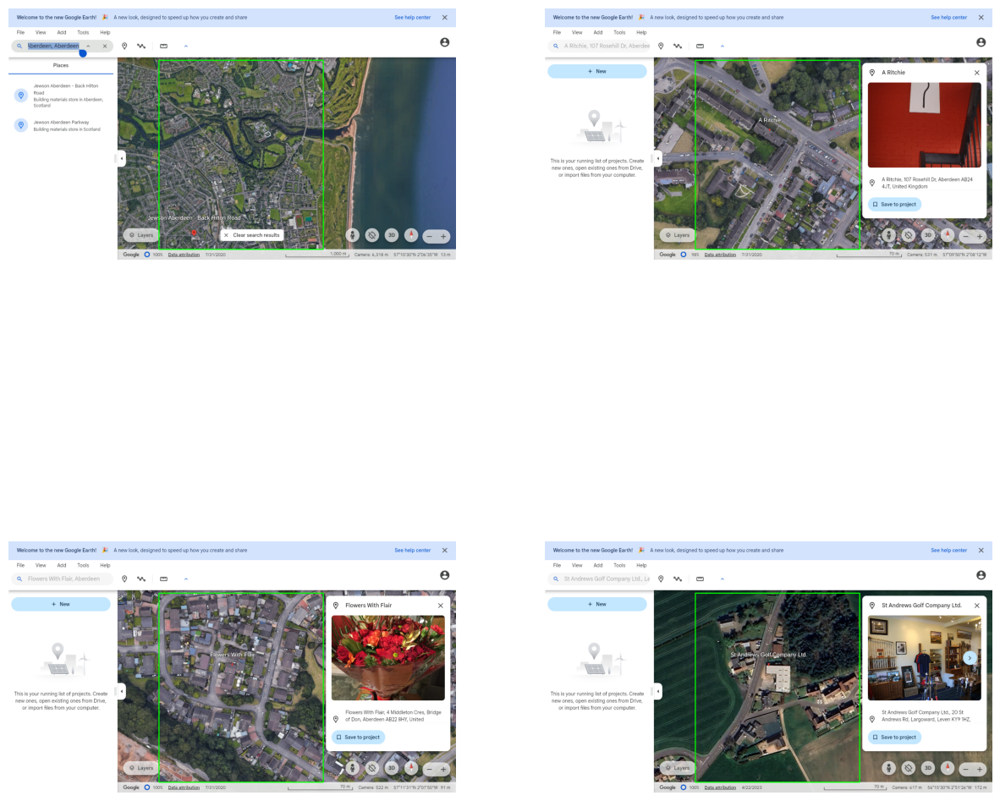

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

file_list = os.listdir(current_run_path_place_screenshot_marker)

random_images = random.sample(file_list, 4)

fig, axes = plt.subplots(2, 2, figsize=(15, 15))

# Loop through each random image and display it
for i, image_file in enumerate(random_images):
    image_path = os.path.join(current_run_path_place_screenshot_marker, image_file)
    image = mpimg.imread(image_path)
    axes[i // 2, i % 2].imshow(image)
    axes[i // 2, i % 2].axis('off')

plt.show()


- **Drawing boundary to exclude unwanted parts of image and plotting**

In [ ]:
import cv2
import os

images = os.listdir(current_run_path_place_screenshot_marker)

for img_path in images:
    # print(img_path)
    image = cv2.imread(os.path.join(current_run_path_place_screenshot_marker, img_path))
    h, w = image.shape[:2]
    # print("total image pixels-> ", h, w)
    x = 150
    y = 430
    width = w - 380
    height = h - 30

    cv2.rectangle(image, (y, x), (width, height), (0, 255, 0), 2)
    cv2.imwrite(os.path.join(current_run_path_place_screenshot_marker, img_path), image)


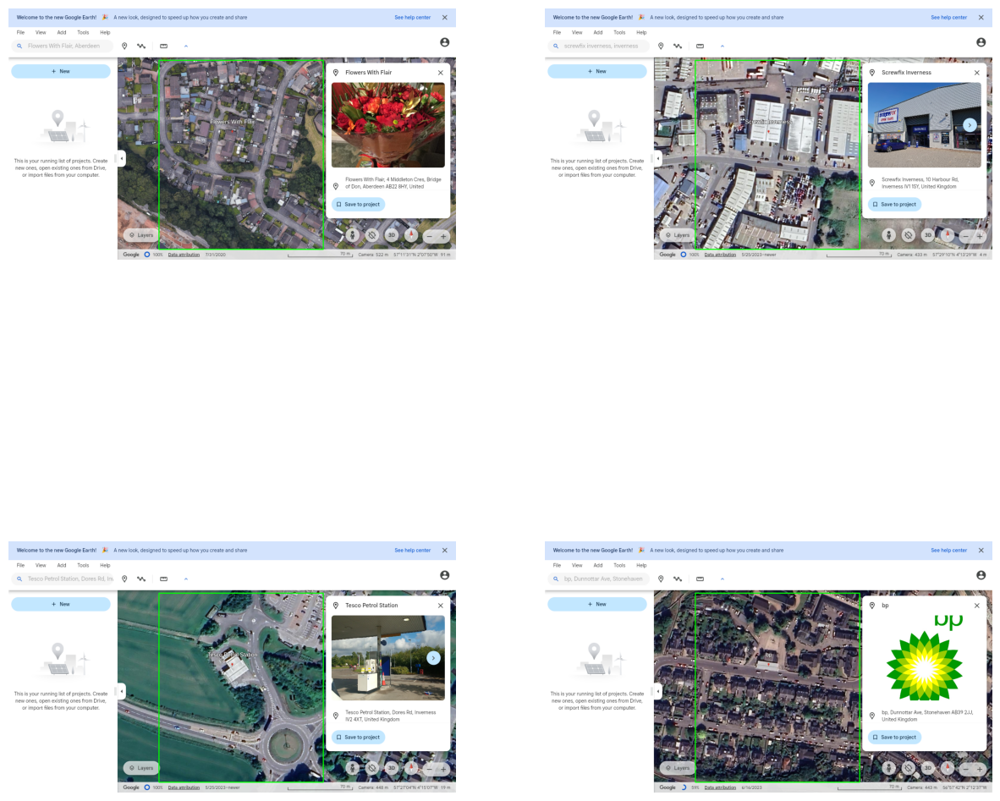

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

file_list = os.listdir(current_run_path_place_screenshot_marker)

random_images = random.sample(file_list, 4)

fig, axes = plt.subplots(2, 2, figsize=(15, 15))

# Loop through each random image and display it
for i, image_file in enumerate(random_images):
    image_path = os.path.join(current_run_path_place_screenshot_marker, image_file)
    image = mpimg.imread(image_path)
    axes[i // 2, i % 2].imshow(image)
    axes[i // 2, i % 2].axis('off')

plt.show()

- **Cropping image as per boundary above and plotting the image**

In [ ]:
import cv2
folder_path = current_run_path_place_screenshot
images = os.listdir(folder_path)
for img_path in images:
    # print(img_path)
    image = cv2.imread(os.path.join(folder_path, img_path))
    # # plt.imshow(image)
    h, w = image.shape[:2]
    # print("total image pixels-> " ,h, w)
    width = w - 380
    height = h - 30
    y=430
    x=150
    crop_image = image[x:height, y:width]
    # plt.imshow(crop_image)
    cv2.imwrite(os.path.join(current_run_path_satellite_images, img_path), crop_image)

In [ ]:
import cv2
folder_path = current_run_path_place_screenshot_marker
images = os.listdir(folder_path)
for img_path in images:
    image = cv2.imread(os.path.join(folder_path, img_path))
    # # plt.imshow(image)
    h, w = image.shape[:2]
    # print("total image pixels-> " ,h, w)
    width = w - 380
    height = h - 30
    y=430
    x=150
    crop_image = image[x:height, y:width]
    # plt.imshow(crop_image)
    cv2.imwrite(os.path.join(current_run_path_satellite_images_marker, img_path), crop_image)

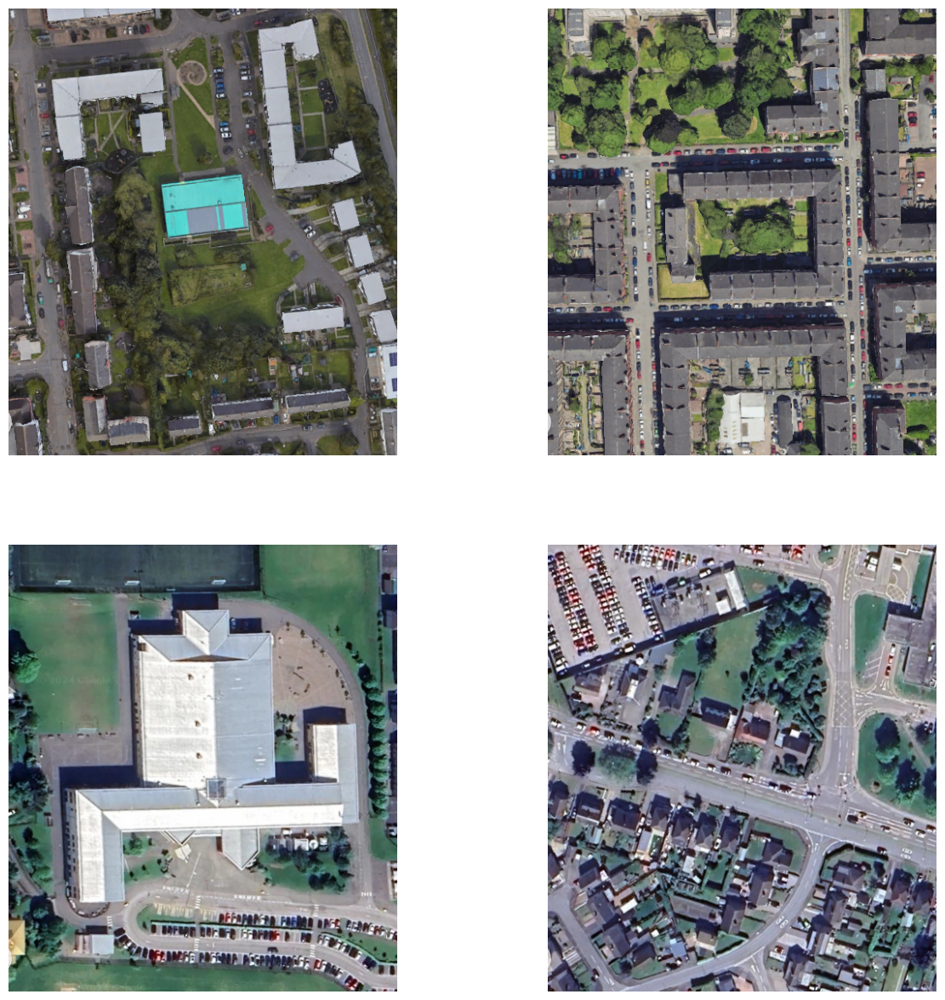

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

file_list = os.listdir(current_run_path_satellite_images)

random_images = random.sample(file_list, 4)

fig, axes = plt.subplots(2, 2, figsize=(15, 15))

# Loop through each random image and display it
for i, image_file in enumerate(random_images):
    image_path = os.path.join(current_run_path_satellite_images, image_file)
    image = mpimg.imread(image_path)
    axes[i // 2, i % 2].imshow(image)
    axes[i // 2, i % 2].axis('off')

plt.show()


- **updating final dataframe after data gathering and processing**

In [ ]:
df_path = []
satellite_images = os.listdir(current_run_path_satellite_images)
for x in range(len(df)):
  for images in satellite_images:
    if df['name'] [x] in images:
      df_path.append(os.path.join(current_run_path_satellite_images, images))

df['path'] = df_path
df.to_csv(os.path.join(current_run_path, "google_earth_search.csv"))
df.head(3)

,name,data,scale,location,location1,latitude,longitude,average_irradiance,total_irradiance,path
0,"A Ritchie, 107 Rosehill Dr, Aberdeen test_1.png",test,70,"09°50""N2°08'12""W","09°50""N 2°08'12""W",9.0139,-2.1367,5.24,1745.82,/content/ai_project/runs/1712486411/satellite_...
1,"Ainslie Park Leisure Centre, Edinburgh test_1.png",test,70,"55°58'18""N3°13'50""W","55°58'18""N 3°13'50""W",55.9717,-3.2306,2.55,852.16,/content/ai_project/runs/1712486411/satellite_...
2,"Aviemore Kart Raceway, Aviemore test_1.png",test,70,NA,NA,NA,NA,NA,NA,/content/ai_project/runs/1712486411/satellite_...


- **splitting training and validation data**

# **THIS IS A VERY CRITICAL STEP FOR TRAINING ON NEW DATA:**
- Uncomment below 2 cells and run the cell.
- If runs file is same as before, no need to uncomment.

In [ ]:
# import random
# import shutil

# split_ratio=0.8
# image_files = os.listdir(current_run_path_satellite_images)
# train_val_images = [image for image in image_files if not image.endswith('test_1.png')]
# split_index = int(len(train_val_images) * split_ratio)
# train_images = train_val_images[:split_index]
# val_images = train_val_images[split_index:]

# for image in train_images:
#     source_path = os.path.join(current_run_path_satellite_images, image)
#     destination_path = os.path.join(current_run_path_train, image)
#     shutil.copy(source_path, destination_path)

# for image in val_images:
#     source_path = os.path.join(current_run_path_satellite_images, image)
#     destination_path = os.path.join(current_run_path_val, image)
#     shutil.copy(source_path, destination_path)

In [ ]:
# import shutil
# image_files = os.listdir(current_run_path_satellite_images)

# test_images = [image for image in image_files if image.endswith('test_1.png')]

# for image in test_images:
#     source_path = os.path.join(current_run_path_satellite_images, image)
#     destination_path = os.path.join(current_run_path_test, image)
#     shutil.copy(source_path, destination_path)


#### 2.3 Instance segmentation <a name="instance-segmentation"></a>

# **THIS IS A VERY CRITICAL STEP FOR TRAINING ON NEW DATA:**
- Go to -> https://www.makesense.ai/
- Upload the train images and create the COCO Dataset.
- Do similar for Validation and uplod the JSON files in the train and val folder respectively.

## 3. AI layer <a name="ai-layer"></a>

#### 3.1 Training <a name="ai-training"></a>

- **Install dependency**

In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 2.1 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15571, done.
remote: Counting objects: 100% (296/296), done.
remote: Compressing objects: 100% (220/220), done.
remote: Total 15571 (delta 110), reused 219 (delta 76), pack-reused 15275
Receiving objects: 100% (15571/15571), 6.42 MiB | 18.94 MiB/s, done.
Resolving deltas: 100% (11225/11225), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.2 MB/s eta 0:00

- **Load Detectron2 model**

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print(TORCH_VERSION)
print(CUDA_VERSION)
print(detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
2.2
cu121
0.6


In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

- **Test the model without training on a test image**

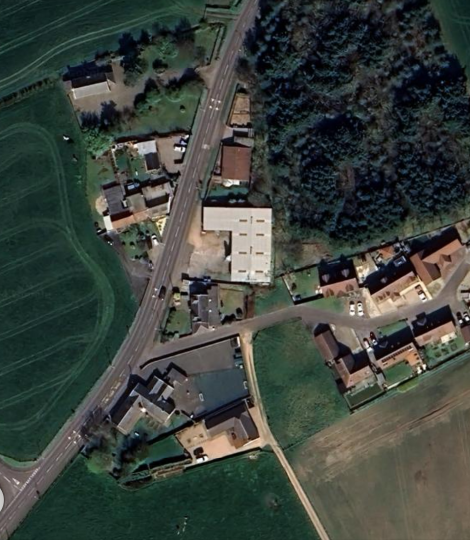

In [ ]:
im_test = cv2.imread(os.path.join(current_run_path_satellite_images, random.choice(os.listdir(current_run_path_satellite_images))))
cv2_imshow(im_test)

- **Configure on a base model to check result**

In [ ]:
cfg_test = get_cfg()
cfg_test.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg_test.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg_test.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg_test)
outputs = predictor(im_test)

[05/02 20:43:34 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


model_final_f10217.pkl: 178MB [00:01, 137MB/s]                           
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


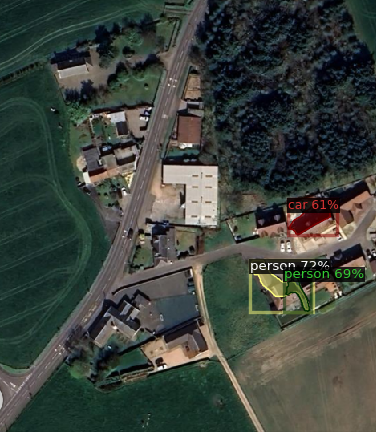

In [ ]:
v = Visualizer(im_test[:, :, ::-1], MetadataCatalog.get(cfg_test.DATASETS.TRAIN[0]), scale=0.8)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

- **Load the training and validation datasets to put into a custom model**

In [ ]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances("my_dataset_train", {}, os.path.join(current_run_path_train, "train.json"), current_run_path_train)
register_coco_instances("my_dataset_val", {}, os.path.join(current_run_path_val, "val.json"), current_run_path_val)

train_metadata = MetadataCatalog.get("my_dataset_train")
train_dataset_dicts = DatasetCatalog.get("my_dataset_train")
val_metadata = MetadataCatalog.get("my_dataset_val")
val_dataset_dicts = DatasetCatalog.get("my_dataset_val")


[05/02 20:43:45 d2.data.datasets.coco]: Loaded 9 images in COCO format from /content/ai_project/runs/1712486411/train/train.json
[05/02 20:43:45 d2.data.datasets.coco]: Loaded 3 images in COCO format from /content/ai_project/runs/1712486411/val/val.json


- **Plot and check the train data with COCO annotations**

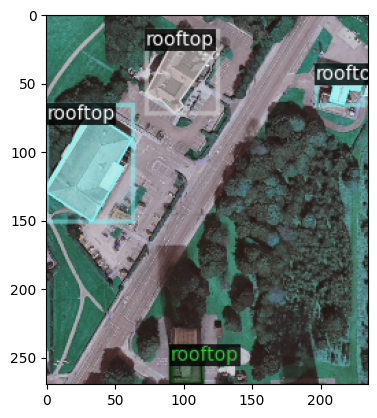

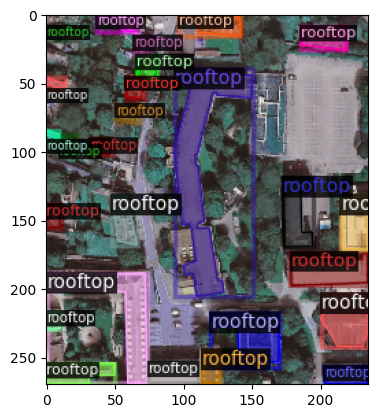

In [ ]:
from matplotlib import pyplot as plt
for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()

- **Load a model and hypertune according to requirement**

In [ ]:
# Import necessary functions and classes from the detectron2 library
from detectron2.data import build_detection_train_loader
from detectron2.engine import DefaultTrainer, default_argument_parser, default_setup, launch
from detectron2.config import get_cfg
import os
from detectron2 import model_zoo

# Create a configuration object that will contain settings for the model, dataset, etc.
cfg = get_cfg()
# Set the directory where outputs like logs, models, etc. will be saved.
cfg.OUTPUT_DIR = current_run_path_model
# Load and merge the configuration from a predefined model available in the model zoo specific for COCO Instance Segmentation.
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
# Define the dataset for training.
cfg.DATASETS.TRAIN = ("my_dataset_train",)
# Define the dataset for validation/testing.
cfg.DATASETS.TEST = ("my_dataset_val",)
# Load and set the pre-trained weights from a model trained on COCO dataset for a fair initialization.
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
# Set the number of images per batch for training.
cfg.SOLVER.IMS_PER_BATCH = 4
# Set the base learning rate for training.
cfg.SOLVER.BASE_LR = 0.002
# Define the maximum number of training iterations.
cfg.SOLVER.MAX_ITER = 2000
# Specify the iteration numbers to decrease the learning rate step-wise.
cfg.SOLVER.STEPS = (1000, 1500)
# Set the gamma value for adjusting the learning rate, used at the steps defined above.
cfg.SOLVER.GAMMA = 0.1
# Set the number of regions of interest (RoIs) per image during training of ROI heads.
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
# Set the number of classes to detect. In this case, it's 1 implying a single class besides background.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

# Ensure the output directory exists.
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
# Create a trainer object with the current configuration.
trainer = DefaultTrainer(cfg)
# Load model and optimizer states if available and start training from there, or start from scratch.
trainer.resume_or_load(resume=False)


[05/02 20:43:59 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_a3ec72.pkl: 254MB [00:02, 99.2MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


## **THIS IS A VERY IMPORTANT STEP:**
- If you are training on a new training data, uncomment below line. Else proceed ahead.

In [ ]:
# trainer.train() #Start the training process

[03/21 12:26:10 d2.engine.train_loop]: Starting training from iteration 0
[03/21 12:26:16 d2.utils.events]:  eta: 0:02:55  iter: 19  total_loss: 4.562  loss_cls: 1.527  loss_box_reg: 0.2088  loss_mask: 0.6934  loss_rpn_cls: 1.546  loss_rpn_loc: 0.6016    time: 0.1889  last_time: 0.1844  data_time: 0.0143  last_data_time: 0.0048   lr: 4.9953e-06  max_mem: 2432M
[03/21 12:26:22 d2.utils.events]:  eta: 0:02:49  iter: 39  total_loss: 3.878  loss_cls: 1.442  loss_box_reg: 0.1943  loss_mask: 0.6905  loss_rpn_cls: 0.9297  loss_rpn_loc: 0.643    time: 0.1812  last_time: 0.1660  data_time: 0.0050  last_data_time: 0.0048   lr: 9.9902e-06  max_mem: 2432M
[03/21 12:26:25 d2.utils.events]:  eta: 0:02:45  iter: 59  total_loss: 3.388  loss_cls: 1.264  loss_box_reg: 0.2297  loss_mask: 0.6843  loss_rpn_cls: 0.6107  loss_rpn_loc: 0.5905    time: 0.1785  last_time: 0.1784  data_time: 0.0051  last_data_time: 0.0050   lr: 1.4985e-05  max_mem: 2432M
[03/21 12:26:29 d2.utils.events]:  eta: 0:02:41  iter: 79 

- **Save the configuration to a config.yaml file**

In [ ]:
import yaml
config_yaml_path = os.path.join(current_run_path_model, "config.yaml")
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

#### 3.2 Validation <a name="ai-validation"></a>

- **Load the configured  model**

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.OUTPUT_DIR = current_run_path_model
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # custom testing threshold
predictor = DefaultPredictor(cfg)

[05/02 20:44:14 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/ai_project/runs/1712486411/model/model_final.pth ...


- **Plot and check the val data with COCO annotations**

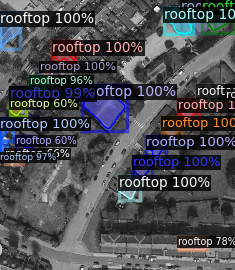

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 1):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

**Check for internal validation**

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Setup the evaluator
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")

# Run evaluation
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[05/02 20:44:24 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[05/02 20:44:24 d2.data.datasets.coco]: Loaded 3 images in COCO format from /content/ai_project/runs/1712486411/val/val.json
[05/02 20:44:24 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  rooftop   | 52           |
|            |              |
[05/02 20:44:24 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/02 20:44:24 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/02 20:44:24 d2.data.common]: Serializing 3 elements to byte tensors and concatenating them all ...
[05/02 20:44:24 d2.data.common]: Serialized dataset takes 0.01 MiB
[05/02 20:44:24 d2.evaluation.evaluator]: Start inference on 3 batches


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/02 20:44:25 d2.evaluation.evaluator]: Total inference time: 0:00:00.244067 (0.244067 s / iter per device, on 1 devices)
[05/02 20:44:25 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.135653 s / iter per device, on 1 devices)
[05/02 20:44:25 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/02 20:44:25 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[05/02 20:44:25 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.426
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.600
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.480
 Average

### 3.3 Inference <a name="ai-inference"></a>

**Step1: Check the output on a random test data.**

Pilton Youth & Children_s Project, Edinburgh test_1.png


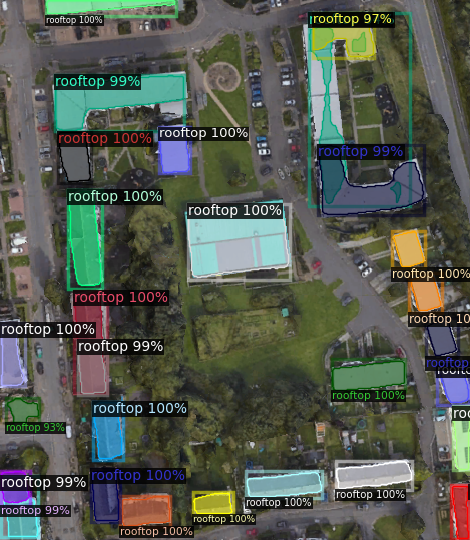

In [ ]:
to_predict_image = random.choice([f for f in os.listdir(current_run_path_test) if f.endswith('.png')])
print(to_predict_image)
new_im = cv2.imread(os.path.join(current_run_path_test, to_predict_image))
outputs  = predictor(new_im)
v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])
# cv2.imwrite("output.png", out.get_image()[:, :, ::-1])

**Step2: Label all the masks**

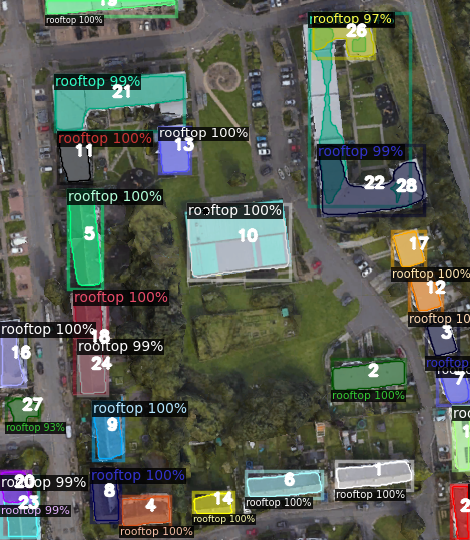

True

In [ ]:
center_x = 205
center_y = 211

instances = outputs["instances"].to("cpu")
output_image_with_numbers = out.get_image()[:, :, ::-1].copy()
font_scale = 0.5

for i, mask in enumerate(instances.pred_masks):
    contours, _ = cv2.findContours((mask > 0.5).numpy().astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) > 0:
        contour = contours[0]
        M = cv2.moments(contour)
        if M["m00"] != 0:
            centroid_x = int(M["m10"] / M["m00"])
            centroid_y = int(M["m01"] / M["m00"])

            cv2.putText(output_image_with_numbers, str(i + 1), (centroid_x, centroid_y),
                        cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 2, cv2.LINE_AA)

radius = 3
color = (0, 0, 0)
thickness = -1
cv2.circle(output_image_with_numbers, (center_x, center_y), radius, color, thickness)
cv2_imshow(output_image_with_numbers)
model_image_output_path = os.path.join(current_run_path, "output_with_bold_numbers.png")

cv2.imwrite(model_image_output_path, output_image_with_numbers)

**Step3: Calculate the area of all annotated masks over rooftops for estimating area.**

In [11]:
total_area = 36000

In [ ]:
masks = outputs["instances"].pred_masks
# print(outputs)
# print(masks.shape)
total_pixels = masks.shape[1] * masks.shape[2]
print("Total Pixels ", total_pixels)
print("######################################################################################")
print("All rooftops")

mask_dict = {}
mask_areas = [mask.sum().item() for mask in masks]
# print(mask_areas)
mask_percentages = [(area / total_pixels) * 100 for area in mask_areas]
print(mask_percentages)
for i, (percentage, area) in enumerate(zip(mask_percentages, mask_areas)):
    mask = i + 1
    pixel_area = area
    percent_area = round(percentage, 2)
    actual_area = round(((percentage * total_area) / 100),2 )
    mask_dict[mask] = actual_area

    print(f"Mask: {mask}, Pixel Area: {pixel_area}, Percent Area: {percentage:.2f}%, Actual Area: {actual_area}")

mask_dict2 = {}
mask_dict3 = {}
mask_dict2["all_mask_area"] = mask_dict
print("######################################################################################")
print("Required rooftops")
target_mask = []
mask_area_within_roi = 0
size_of_point = 5
for mask_number, mask in enumerate(masks, start=1):
    mask_height, mask_width = mask.shape
    roi_start_x = max(center_x - size_of_point, 0)
    roi_end_x = min(center_x + size_of_point, mask_width)
    roi_start_y = max(center_y - size_of_point, 0)
    roi_end_y = min(center_y + size_of_point, mask_height)
    roi_mask = mask[roi_start_y:roi_end_y, roi_start_x:roi_end_x]
    roi_mask_np = roi_mask.cpu().numpy() if isinstance(roi_mask, torch.Tensor) else roi_mask
    if np.sum(roi_mask_np) != 0:
      mask_area_within_roi += mask.sum().item()
      # mask_dict3[mask_number] = mask.sum().item()
      mask_dict2["target_mask"] = mask_number
      print(f"Mask {mask_number}: with pixel area: {mask.sum().item()}")

print(f"Total area of masks at point ({center_x}, {center_y}) for all masks: {mask_area_within_roi}")
# mask_dict2["target_mask"] = mask_dict3

main_dict = {}
main_dict[to_predict_image] = mask_dict2

Total Pixels  253800
######################################################################################
All rooftops
[0.6004728132387707, 0.6847911741528763, 0.2998423955870765, 0.49605988967691095, 0.9566587864460204, 0.5764381402679275, 0.3412135539795114, 0.49093774625689524, 0.5437352245862884, 2.4247438928289995, 0.5252167060677699, 0.31796690307328607, 0.47557131599684793, 0.27620173364854217, 0.3546099290780142, 0.42750197005516155, 0.3108747044917258, 1.0153664302600471, 0.48305752561071713, 0.3061465721040189, 1.5874704491725768, 1.5851063829787233, 0.6769109535066982, 0.48187549251379036, 0.2844759653270292, 0.6812450748620962, 0.21473601260835304, 1.1989755713159969]
Mask: 1, Pixel Area: 1524, Percent Area: 0.60%, Actual Area: 216.17
Mask: 2, Pixel Area: 1738, Percent Area: 0.68%, Actual Area: 246.52
Mask: 3, Pixel Area: 761, Percent Area: 0.30%, Actual Area: 107.94
Mask: 4, Pixel Area: 1259, Percent Area: 0.50%, Actual Area: 178.58
Mask: 5, Pixel Area: 2428, Percent Are

**Step4: Check the dictionary which is created as result of above output**

In [ ]:
main_dict

{'Pilton Youth & Children_s Project, Edinburgh test_1.png': {'all_mask_area': {1: 216.17,
   2: 246.52,
   3: 107.94,
   4: 178.58,
   5: 344.4,
   6: 207.52,
   7: 122.84,
   8: 176.74,
   9: 195.74,
   10: 872.91,
   11: 189.08,
   12: 114.47,
   13: 171.21,
   14: 99.43,
   15: 127.66,
   16: 153.9,
   17: 111.91,
   18: 365.53,
   19: 173.9,
   20: 110.21,
   21: 571.49,
   22: 570.64,
   23: 243.69,
   24: 173.48,
   25: 102.41,
   26: 245.25,
   27: 77.3,
   28: 431.63},
  'target_mask': 10}}

**Step5: Compare the above dictionary with mask information below.**

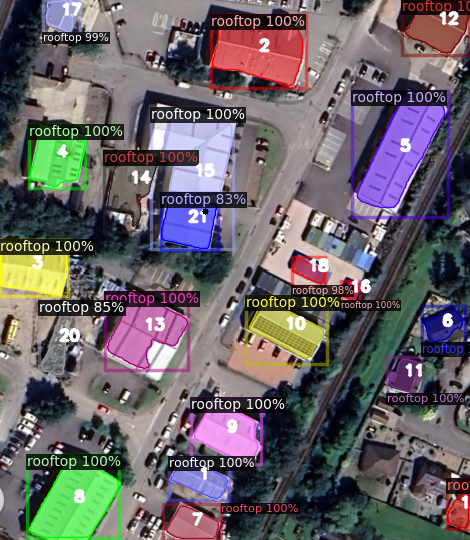

In [ ]:
cv2_imshow(output_image_with_numbers)

## 4. Evaluation <a name="evaluation"></a>

## THIS IS A VERY IMPORTANT STEP:
- Create a COCO Dataset for Test dataset if you want to evaluate.
- Upload the JSON file in test folder.

**Step1: Load the COCO Data annotations (masks)**

In [ ]:
import json
from PIL import Image, ImageDraw

image_test_path = os.path.join(current_run_path_test, to_predict_image)
image_test = Image.open(image_test_path)
width_test, height_test = image_test.size

with open(os.path.join(current_run_path_test, 'test.json')) as f:
    coco_data = json.load(f)
img_id = None
for image in coco_data['images']:
    if image['file_name'] == to_predict_image:
        img_id = image['id']
        break

if img_id is None:
    mask2 = None
img_ann = [ann for ann in coco_data['annotations'] if ann['image_id'] == img_id]

In [ ]:
import numpy as np
from PIL import Image, ImageDraw

height = height_test
width = width_test

masks = []
for ann in img_ann:
    if 'segmentation' in ann and isinstance(ann['segmentation'], list):
        for segmentation in ann['segmentation']:
            # Create a new image for the mask
            mask_img = Image.new('L', (width, height), 0)
            draw = ImageDraw.Draw(mask_img)

            # Reshape flat list to a list of tuples
            if isinstance(segmentation, list):
                polygon = [(segmentation[i], segmentation[i+1]) for i in range(0, len(segmentation), 2)]
                draw.polygon(polygon, outline=1, fill=1)

            # Convert the PIL image to a NumPy array
            mask = np.array(mask_img)
            masks.append(mask)


**Step2: Plot the mask of the target rooftop of a single test image**

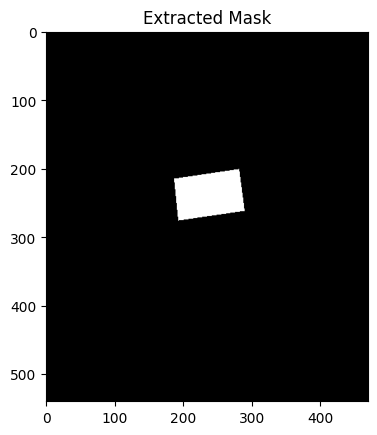

In [ ]:
from pycocotools.mask import decode
from matplotlib import pyplot as plt

for ann in img_ann:
    if 'segmentation' in ann and isinstance(ann['segmentation'], dict):
        # RLE format
        rle = ann['segmentation']
        mask = decode(rle)
        masks.append(mask)

# Check if any masks were generated and display the first one
if masks:
    plt.imshow(masks[0], cmap='gray')
    plt.title('Extracted Mask')
    plt.show()
    mask_image = Image.fromarray((masks[0] * 255).astype(np.uint8))
    test_image_output_path = os.path.join(current_run_path, "output_test_image_mask.png")
    mask_image.save(test_image_output_path)
    mask2 = mask
else:
    blank_image = np.zeros((height_test, width_test), dtype=np.uint8)
    plt.imshow(blank_image, cmap='gray')
    plt.title('No Mask Found')
    plt.show()
    blank_image_pil = Image.fromarray(blank_image)
    test_image_output_path = os.path.join(current_run_path, "output_test_image_mask.png")
    blank_image_pil.save(test_image_output_path)
    mask2 = None
    print("No masks were found for the specified image.")


**Step3: Load the mask information as recieved from the model for the test image.**

In [ ]:
if 'target_mask' in main_dict[to_predict_image]:
    target_mask = int(main_dict[to_predict_image]['target_mask']) - 1
    print("Target Mask: ", target_mask + 1)
else:
    print("Target Mask not found!")
    target_mask = None

if target_mask != None:
  pred_masks = outputs["instances"].pred_masks.cpu().numpy()
  mask1 = pred_masks[target_mask]
else:
  mask1 = None
print(mask1)

Target Mask:  10
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


**Step4: Compare both the masks target and actual and return the values**

In [ ]:
import numpy as np

def compute_metrics(mask_gt, mask_pred):
    # Compute Intersection and Union for IoU
    intersection = np.logical_and(mask_gt, mask_pred)
    union = np.logical_or(mask_gt, mask_pred)
    iou_score = np.sum(intersection) / np.sum(union)

    # Compute True Positives, False Positives, and False Negatives
    true_positive = np.logical_and(mask_gt, mask_pred)
    false_positive = np.logical_and(np.logical_not(mask_gt), mask_pred)
    false_negative = np.logical_and(mask_gt, np.logical_not(mask_pred))

    # Calculate Precision and Recall
    precision = np.sum(true_positive) / (np.sum(true_positive) + np.sum(false_positive))
    recall = np.sum(true_positive) / (np.sum(true_positive) + np.sum(false_negative))

    return iou_score, precision, recall

def compute_metrics_checker(mask_gt, mask_pred):
  iou_score= 0
  precision= 0
  recal = 0

  mask1 = mask_pred
  mask2 = mask_gt
  if mask1 is not None and mask2 is not None:
    specific_pred_mask = mask1
    specific_gt_mask = mask2
    iou_score, precision, recall = compute_metrics(specific_gt_mask, specific_pred_mask)

  elif mask1 is None and mask2 is None:
      iou_score = 0
      precision = 1
      recall = 1

  elif mask1 is not None and mask2 is None:
      iou_score = 0
      precision = 0
      recall = 0

  elif mask1 is None and mask2 is  not None:
      iou_score = 0
      precision = 0
      recall = 0

  # print(f"IoU score: {iou_score}, Precision: {precision}, Recall: {recall}")

  return iou_score, precision, recall



**Step5: Save the outputs into a single plotted image and save in a folder**

In [ ]:
def create_output_image(image_path1, image_path2, image_path3, image_path4, image_path5, mask_gt, mask_pred, str_in1, str_in2):
    iou_score, precision, recall = compute_metrics_checker(mask_gt, mask_pred)

    # Load the images using PIL
    image1 = Image.open(image_path1)
    image2 = Image.open(image_path2)
    image3 = Image.open(image_path3)
    image4 = Image.open(image_path4)

    # Create a figure with four subplots in a 2x2 grid
    fig, ax = plt.subplots(2, 2, figsize=(5, 5))

    # Display first image
    ax[0, 1].imshow(image1)
    ax[0, 1].set_title('Input Rooftop', fontsize=8)
    ax[0, 1].axis('off')

    # Display second image
    ax[1, 1].imshow(image2)
    ax[1, 1].set_title('Model Output', fontsize=8)
    ax[1, 1].axis('off')

    # Display third image
    ax[1, 0].imshow(image3)
    ax[1, 0].set_title('Expected Output', fontsize=8)
    ax[1, 0].axis('off')

    # Display fourth image
    ax[0, 0].imshow(image4)
    ax[0, 0].set_title('Target Rooftop', fontsize=8)
    ax[0, 0].axis('off')

    # Display metrics at the bottom of the figure
    metrics_text = f"IoU: {iou_score:.2f}, Precision: {precision:.2f}, Recall: {recall:.2f}"
    fig.text(0.5, 0.09, metrics_text, ha='center', va='center', fontsize=8)

    additional_text = str_in1
    fig.text(0.5, 0.06, additional_text, ha='center', va='center', fontsize=8)

    additional_text2 = str_in2
    fig.text(0.5, 0.03, additional_text2, ha='center', va='center', fontsize=8)



    # Show the plot
    plt.show()

    # Save the figure to a file
    combined_test_image_output_path = image_path5
    fig.savefig(combined_test_image_output_path, dpi=300, bbox_inches='tight')

    return iou_score, precision, recall


**Step6: View the image**

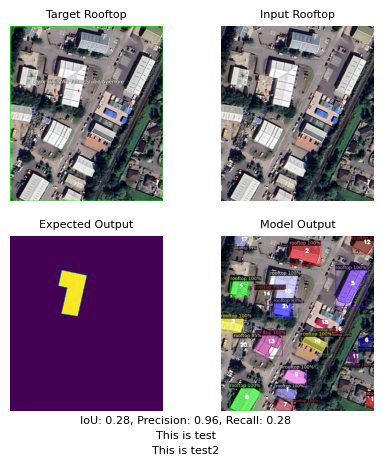

'0.28'

In [ ]:
image_path1 = os.path.join(current_run_path_test, to_predict_image)
image_path2 = model_image_output_path
image_path3 = test_image_output_path
image_path4 = os.path.join(current_run_path_satellite_images_marker, to_predict_image)
image_path5 = os.path.join(current_run_path, "output_test_image_combined.png")
str1 = "This is test"
str2 = "This is test2"
mask2_1 = mask2
mask1_1 = mask1
iou_score, precision, recall = create_output_image(image_path1, image_path2, image_path3, image_path4, image_path5, mask2_1, mask1_1, str1, str2)
f"{iou_score:.2f}"

## 5. Compilation <a name="compilation"></a>

## **THIS IS AN IMPORTANT CELL**
- The same steps done in [Inference](#ai-inference) and [Evaluation](#evaluation) that is Step 1- 6 are done for all images in below steps with functions.

In [ ]:
df1 = df.loc[df["data"] == "test"].reset_index(drop=True)
df1.head(3)

,name,data,scale,location,location1,latitude,longitude,average_irradiance,total_irradiance,path
0,"A Ritchie, 107 Rosehill Dr, Aberdeen test_1.png",test,70,"09°50""N2°08'12""W","09°50""N 2°08'12""W",9.0139,-2.1367,5.24,1745.82,/content/ai_project/runs/1712486411/satellite_...
1,"Ainslie Park Leisure Centre, Edinburgh test_1.png",test,70,"55°58'18""N3°13'50""W","55°58'18""N 3°13'50""W",55.9717,-3.2306,2.55,852.16,/content/ai_project/runs/1712486411/satellite_...
2,"Aviemore Kart Raceway, Aviemore test_1.png",test,70,NA,NA,NA,NA,NA,NA,/content/ai_project/runs/1712486411/satellite_...


In [ ]:
def detectron2_output(image_path, test_op_path):

  test_op_path1 = test_op_path.split('.png')[0] + "_model.png"

  new_im = cv2.imread(image_path)
  outputs1  = predictor(new_im)
  v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
  out = v.draw_instance_predictions(outputs1["instances"].to("cpu"))
  image_output = out.get_image()[:, :, ::-1]


  cv2.imwrite(test_op_path1, image_output)


  center_x = 205
  center_y = 211

  instances = outputs1["instances"].to("cpu")
  output_image_with_numbers = out.get_image()[:, :, ::-1].copy()
  font_scale = 0.5

  for i, mask in enumerate(instances.pred_masks):
      contours, _ = cv2.findContours((mask > 0.5).numpy().astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

      if len(contours) > 0:
          contour = contours[0]
          M = cv2.moments(contour)
          if M["m00"] != 0:
              centroid_x = int(M["m10"] / M["m00"])
              centroid_y = int(M["m01"] / M["m00"])

              cv2.putText(output_image_with_numbers, str(i + 1), (centroid_x, centroid_y),
                          cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255, 255, 255), 2, cv2.LINE_AA)

  radius = 3
  color = (0, 0, 0)
  thickness = -1
  cv2.circle(output_image_with_numbers, (center_x, center_y), radius, color, thickness)
  # cv2_imshow(output_image_with_numbers)

  cv2.imwrite(test_op_path1, output_image_with_numbers)

  return output_image_with_numbers, outputs1, test_op_path1

In [ ]:
def image_mask_area(model_output, image_name):

  total_area = 36000

  masks = model_output["instances"].pred_masks
  # print(masks.shape)
  total_pixels = masks.shape[1] * masks.shape[2]
  # print("Total Pixels ", total_pixels)
  # print("######################################################################################")
  # print("All rooftops")

  mask_dict = {}
  mask_areas = [mask.sum().item() for mask in masks]
  mask_percentages = [(area / total_pixels) * 100 for area in mask_areas]
  for i, (percentage, area) in enumerate(zip(mask_percentages, mask_areas)):
      mask = i + 1
      pixel_area = area
      percent_area = round(percentage, 2)
      actual_area = round(((percentage * total_area) / 100),2 )
      mask_dict[mask] = actual_area

      # print(f"Mask: {mask}, Pixel Area: {pixel_area}, Percent Area: {percentage:.2f}%, Actual Area: {actual_area}")

  mask_dict2 = {}
  mask_dict3 = {}
  mask_dict2["all_mask_area"] = mask_dict
  # print("######################################################################################")
  # print("Required rooftops")
  target_mask = []
  mask_area_within_roi = 0
  size_of_point = 5
  for mask_number, mask in enumerate(masks, start=1):
      mask_height, mask_width = mask.shape
      roi_start_x = max(center_x - size_of_point, 0)
      roi_end_x = min(center_x + size_of_point, mask_width)
      roi_start_y = max(center_y - size_of_point, 0)
      roi_end_y = min(center_y + size_of_point, mask_height)
      roi_mask = mask[roi_start_y:roi_end_y, roi_start_x:roi_end_x]
      roi_mask_np = roi_mask.cpu().numpy() if isinstance(roi_mask, torch.Tensor) else roi_mask
      if np.sum(roi_mask_np) != 0:
        mask_area_within_roi += mask.sum().item()
        # mask_dict3[mask_number] = mask.sum().item()
        mask_dict2["target_mask"] = mask_number
        # print(f"Mask {mask_number}: with pixel area: {mask.sum().item()}")

  # print(f"Total area of masks at point ({center_x}, {center_y}) for all masks: {mask_area_within_roi}")
  # mask_dict2["target_mask"] = mask_dict3

  main_dict1 = {}
  main_dict1[image_name] = mask_dict2
  return main_dict1


In [ ]:
import json
from PIL import Image, ImageDraw
import numpy as np
from pycocotools.mask import decode
from matplotlib import pyplot as plt


def evaluation_expected_mask(to_predict_image, test_op_path):

  test_op_path2 = test_op_path.split('.png')[0] + "_expected.png"


  image_test_path = os.path.join(current_run_path_test, to_predict_image)
  image_test = Image.open(image_test_path)
  width_test, height_test = image_test.size

  with open(os.path.join(current_run_path_test, 'test.json')) as f:
      coco_data = json.load(f)
  img_id = None
  for image in coco_data['images']:
      if image['file_name'] == to_predict_image:
          img_id = image['id']
          break

  if img_id is None:
      mask2 = None
  img_ann = [ann for ann in coco_data['annotations'] if ann['image_id'] == img_id]



  height = height_test
  width = width_test

  masks = []
  for ann in img_ann:
      if 'segmentation' in ann and isinstance(ann['segmentation'], list):
          for segmentation in ann['segmentation']:
              # Create a new image for the mask
              mask_img = Image.new('L', (width, height), 0)
              draw = ImageDraw.Draw(mask_img)

              # Reshape flat list to a list of tuples
              if isinstance(segmentation, list):
                  polygon = [(segmentation[i], segmentation[i+1]) for i in range(0, len(segmentation), 2)]
                  draw.polygon(polygon, outline=1, fill=1)

              # Convert the PIL image to a NumPy array
              mask = np.array(mask_img)
              masks.append(mask)


  for ann in img_ann:
      if 'segmentation' in ann and isinstance(ann['segmentation'], dict):
          rle = ann['segmentation']
          mask = decode(rle)
          masks.append(mask)

  if masks:
      # plt.imshow(masks[0], cmap='gray')
      # plt.title('Extracted Mask')
      # plt.show()
      mask_image = Image.fromarray((masks[0] * 255).astype(np.uint8))
      # test_image_output_path = os.path.join(current_run_path, "output_test_image_mask.png")
      mask_image.save(test_op_path2)
      mask2 = mask
      print("Expected Mask found.")
  else:
      blank_image = np.zeros((height_test, width_test), dtype=np.uint8)
      # plt.imshow(blank_image, cmap='gray')
      # plt.title('No Mask Found')
      # plt.show()
      blank_image_pil = Image.fromarray(blank_image)
      # test_image_output_path = os.path.join(current_run_path, "output_test_image_mask.png")
      blank_image_pil.save(test_op_path2)
      mask2 = None
      print("Expected Mask not found.")

  return mask2, test_op_path2




In [ ]:
def evaluation_pred_mask(outputs, main_dict, to_predict_image):
  if 'target_mask' in main_dict[to_predict_image]:
      target_mask = int(main_dict[to_predict_image]['target_mask']) - 1
      print("Target Mask: ", target_mask + 1)
  else:
      print("Target Mask not found!")
      target_mask = None
  if target_mask != None:
    pred_masks = outputs["instances"].pred_masks.cpu().numpy()
    mask1 = pred_masks[target_mask]
  else:
    mask1 = None
  return mask1

**IMPORTANT CELL**
- Run below cell to infer data for all test cases and get the resultant output.

A Ritchie, 107 Rosehill Dr, Aberdeen test_1.png
Expected Mask found.
Target Mask:  5


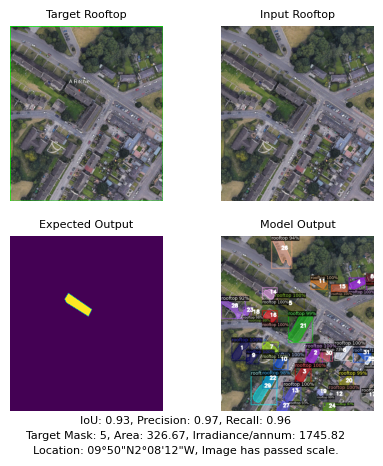

Ainslie Park Leisure Centre, Edinburgh test_1.png
Expected Mask found.
Target Mask:  5


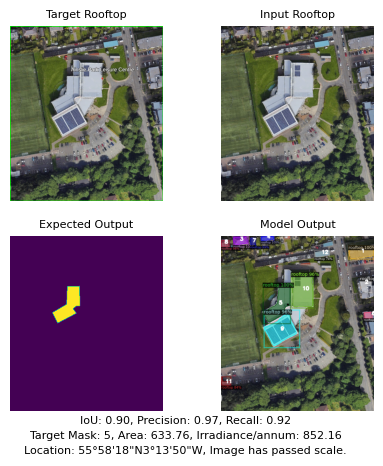

Aviemore Kart Raceway, Aviemore test_1.png
Expected Mask found.
Target Mask:  1


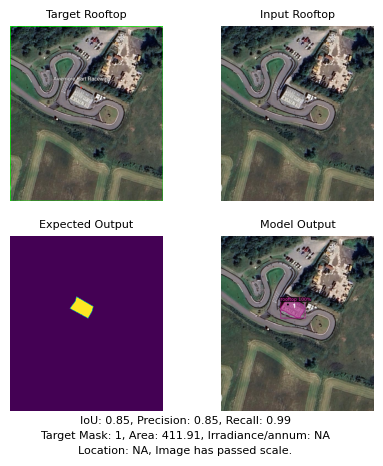

Banchory Academy, Banchory test_1.png
Expected Mask found.
Target Mask:  3


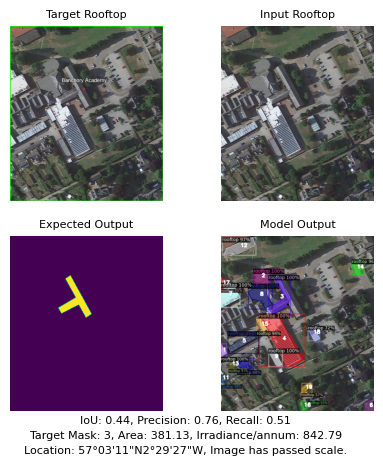

Booker Glasgow, Glasgow test_1.png
Expected Mask found.
Target Mask:  1


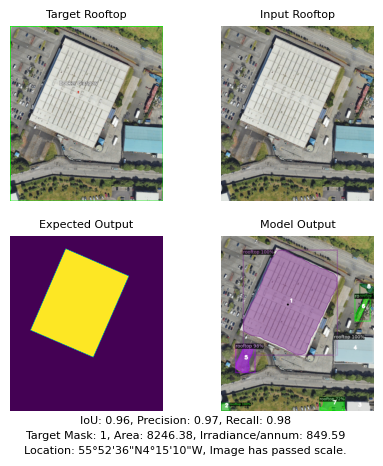

Brewsterwells Crematorium Ltd, Leven test_1.png
Expected Mask found.
Target Mask:  1


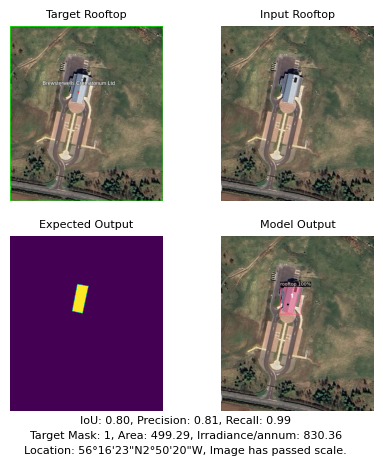

Bridge of Don Country Club, Glashieburn test_1.png
Expected Mask found.
Target Mask:  10


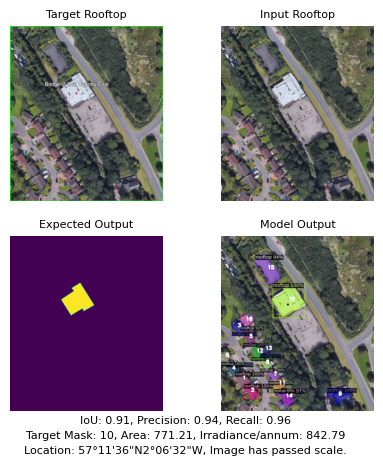

Bristow, HM Coastguard SAR, Inverness test_1.png
Expected Mask found.
Target Mask:  1


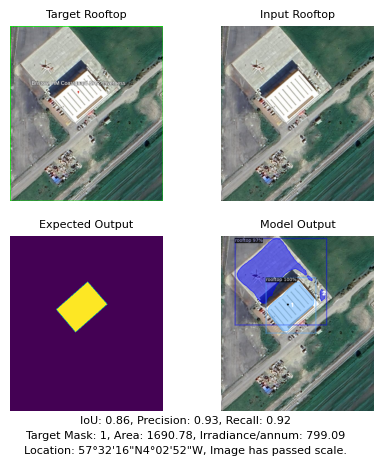

Clyde Auto Repairs, Glasgow test_1.png
Expected Mask not found.
Target Mask:  15


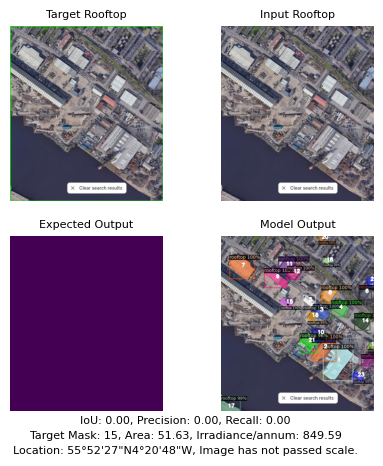

D M Forklifts, Lyndon, Stonehaven test_1.png
Expected Mask found.
Target Mask:  1


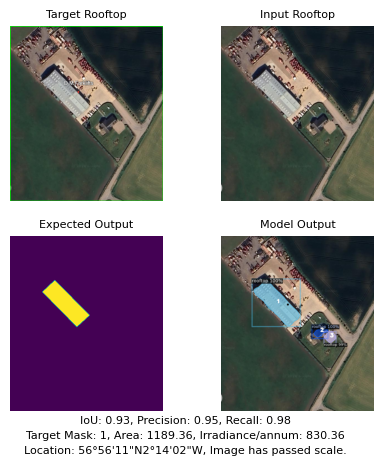

Dark Trinity Art Tattoo Studio, Aviemore test_1.png
Expected Mask found.
Target Mask:  21


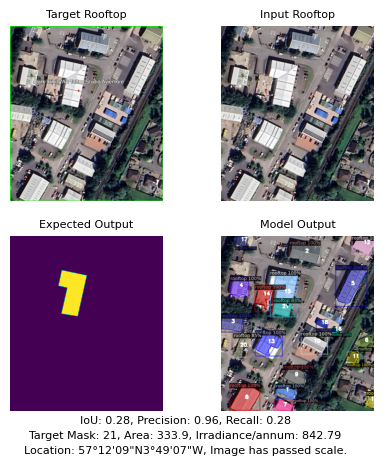

East Sands Leisure Centre, St Andrews test_1.png
Expected Mask found.
Target Mask:  17


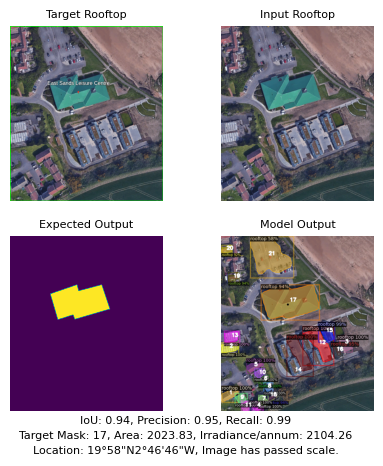

Flowers With Flair, Aberdeen test_1.png
Expected Mask found.
Target Mask:  12


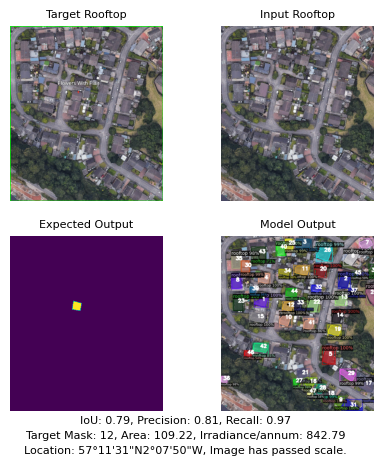

Foxnose, Partick, Glasgow test_1.png
Expected Mask found.
Target Mask:  11


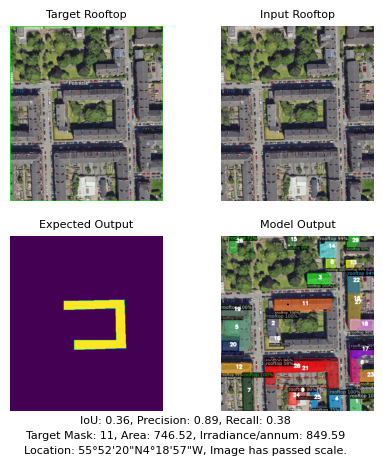

IKEA Edinburgh, Costkea Way test_1.png
Expected Mask found.
Target Mask not found!


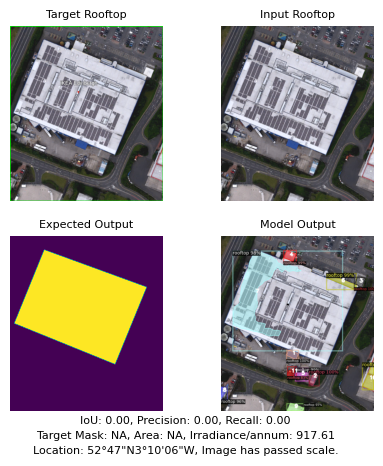

Jewson Aberdeen, Aberdeen test_1.png
Expected Mask not found.
Target Mask not found!


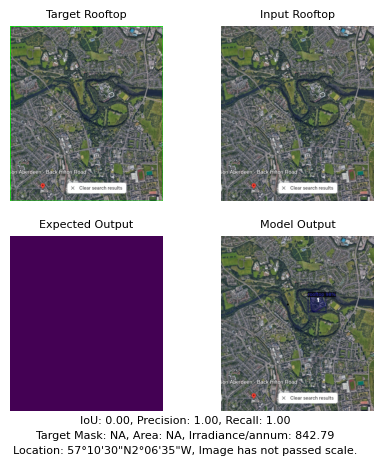

Millburn Academy, Inverness test_1.png
Expected Mask found.
Target Mask:  4


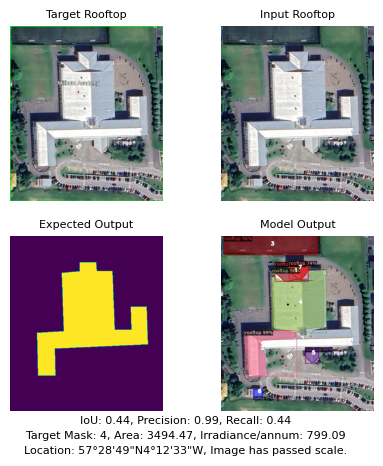

Murrayburn Primary School, Edinburgh test_1.png
Expected Mask found.
Target Mask not found!


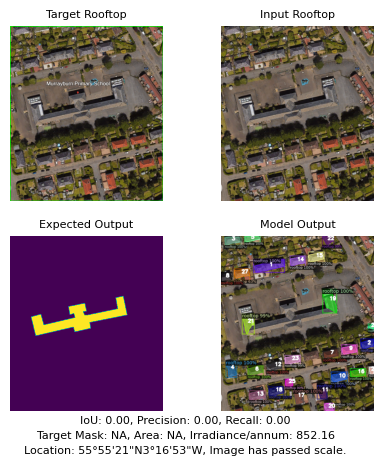

Nucore Group, Aberdeen test_1.png
Expected Mask found.
Target Mask:  1


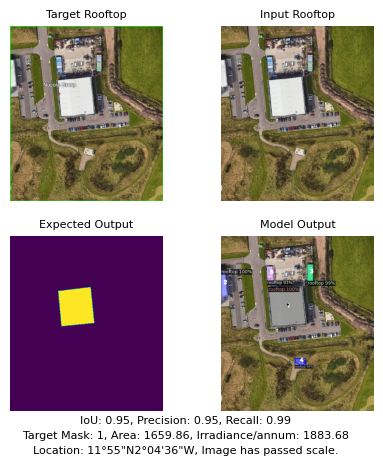

OVO Hydro, Glasgow test_1.png
Expected Mask found.
Target Mask not found!


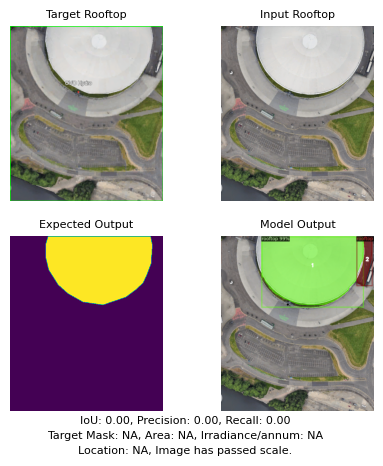

Pilton Youth & Children_s Project, Edinburgh test_1.png
Expected Mask found.
Target Mask:  10


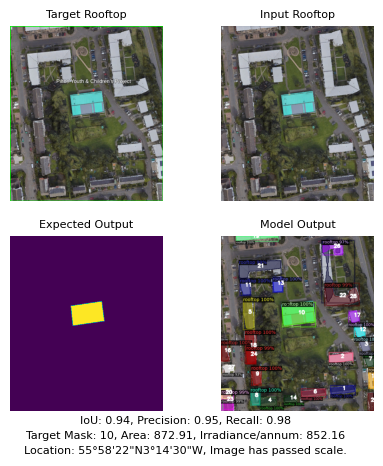

Robroyston Retail Park, Glasgow test_1.png
Expected Mask found.
Target Mask not found!


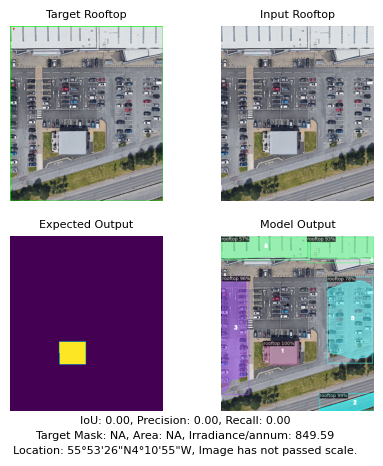

St Andrews Golf Company Ltd., Leven test_1.png
Expected Mask found.
Target Mask:  1


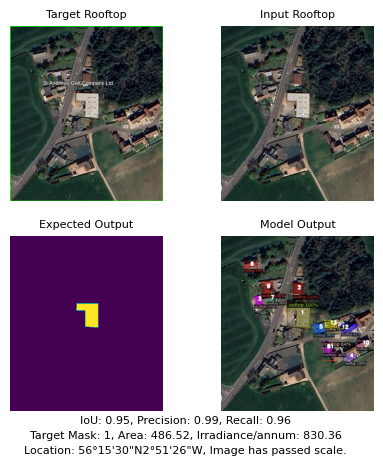

Sterling Home, Aberdeen test_1.png
Expected Mask found.
Target Mask:  1


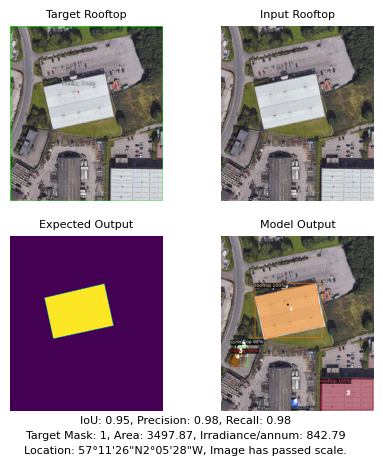

String Sports, Glasgow test_1.png
Expected Mask found.
Target Mask not found!


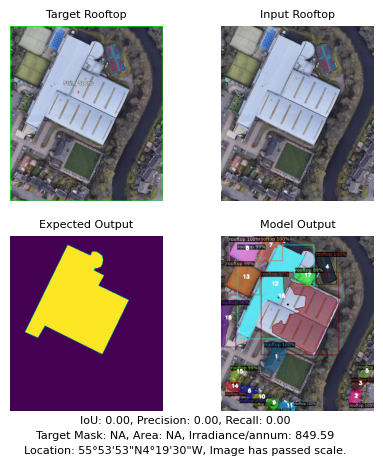

Tesco Petrol Station, Dores Rd, Inverness test_1.png
Expected Mask found.
Target Mask:  1


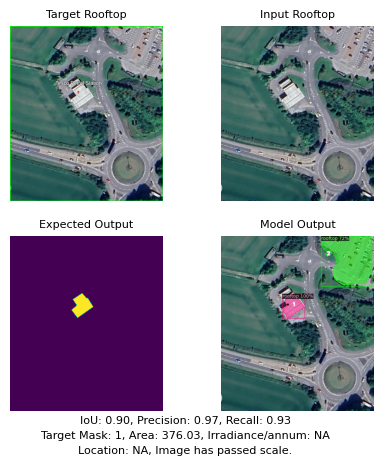

The Seafood Ristorante, St Andrews test_1.png
Expected Mask found.
Target Mask:  2


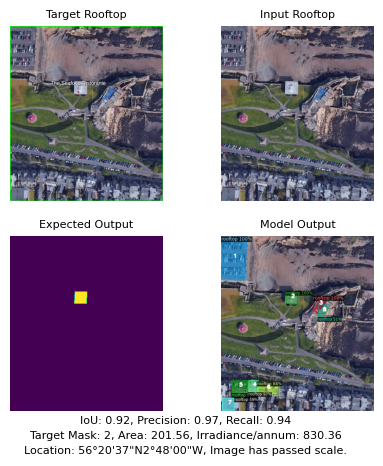

UPS, 30 S Gyle Cres, Edinburgh test_1.png
Expected Mask found.
Target Mask:  8


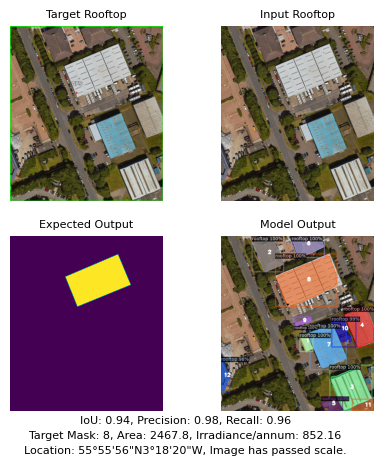

arden court, inverness test_1.png
Expected Mask found.
Target Mask not found!


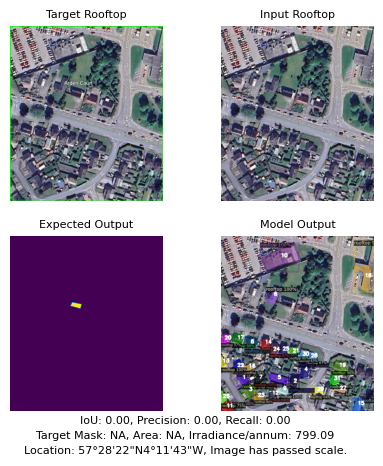

bp, Dunnottar Ave, Stonehaven test_1.png
Expected Mask found.
Target Mask:  9


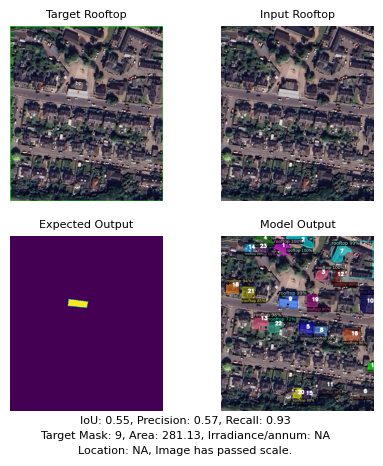

parcelforce worldwide, inverness test_1.png
Expected Mask found.
Target Mask:  4


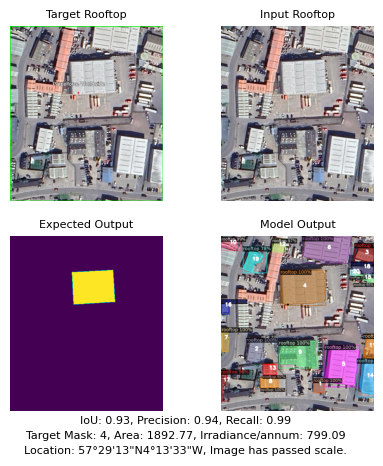

screwfix inverness, inverness test_1.png
Expected Mask found.
Target Mask:  3


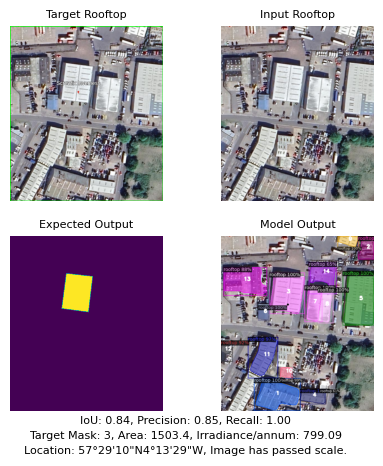

In [ ]:
# df1 = df1[0:1]
mask_area = []
target_mask = []
target_area = []
image_name = []
df_iou = []
df_precision = []
df_recall = []
for x in range(len(df1)):
  main_dict_op = []
  image_path = df1["path"][x]
  image_name = df1["path"][x].split("/satellite_images/")[1]
  print(image_name)
  test_op_path = os.path.join(current_run_path_test_output, df1["name"][x])

  img1, model_output, model_output_image_path = detectron2_output(image_path, test_op_path)

  main_dict_op = image_mask_area(model_output, image_name)
  # print(main_dict_op)

  image_path1 = os.path.join(current_run_path_test, image_name)
  image_path2 = model_output_image_path

  image_path4 = os.path.join(current_run_path_satellite_images_marker, image_name)

  # test_op_path5 = test_op_path.split('.png')[0] + "_combined.png"
  image_path5 = os.path.join(current_run_path_test_output_combined, image_name)


  if len(main_dict_op) != 0:
    # print(main_dict_op)
    mask_actual, expected_output_image_path = evaluation_expected_mask(image_name, test_op_path)
    image_path3 = expected_output_image_path

    mask_test = evaluation_pred_mask(model_output, main_dict_op, image_name)

    mask_gt = mask_actual
    mask_pred = mask_test




    mask_area.append(main_dict_op)
    if image_name in main_dict_op and 'target_mask' in main_dict_op[image_name]:
      target_mask_op = main_dict_op[image_name]['target_mask']
      # print("Target Mask: ", target_mask_op)
      target_mask.append(target_mask_op)
      target_mask_area = main_dict_op[image_name]['all_mask_area'][target_mask_op]
      # print("Target Area: ", target_mask_area)
      target_area.append(target_mask_area)
    else:
      target_mask_op = "NA"
      target_mask.append(target_mask_op)
      target_mask_area = "NA"
      target_area.append(target_mask_area)

    total_irradiance = df1["total_irradiance"][x]
    image_text1 = f"Target Mask: {target_mask_op}, Area: {target_mask_area}, Irradiance/annum: {total_irradiance}"

    coordinates = df1["location"][x]
    try:
      scale1 = int(df1["scale"][x])
    except:
      scale1 = "NA"

    if scale1 == 70:
      scale_print = "Image has passed scale."
    else:
      scale_print = "Image has not passed scale."

    image_text2 = f"Location: {coordinates}, {scale_print}"

    iou_score, precision, recall = create_output_image(image_path1, image_path2, image_path3, image_path4, image_path5, mask_actual, mask_test, image_text1, image_text2)

    # iou_score, precision, recall = compute_metrics_checker(mask_gt, mask_pred)

    df_iou.append(float(f"{iou_score:.2f}"))
    df_precision.append(float(f"{precision:.2f}"))
    df_recall.append(float(f"{recall:.2f}"))
  else:
    df_iou.append("NA")
    df_precision.append("NA")
    df_recall.appen("NA")
    mask_area.append("NA")
    target_mask.append("NA")
    target_area.append("NA")

df1['target_mask'] = target_mask
df1['target_area'] = target_area
df1['all_area'] = mask_area
df1['iou'] = df_iou
df1['precision'] = df_precision
df1['recall'] = df_recall

- **Save the files into CSV for output**

In [ ]:
df1.to_csv(os.path.join(current_run_path, "model_output.csv"))
df2 = df1
df2 = df2[['name', 'target_mask', 'target_area','iou', 'precision','recall', 'total_irradiance','average_irradiance', 'scale', 'location', 'all_area']]
df2['name'] = df2['name'].apply(lambda x: x.replace(" test_1.png", ""))
df2.to_csv(os.path.join(current_run_path, "final_output.csv"), index=False)
df2.head(3)

<ipython-input-636-66acbae50d46>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['name'] = df2['name'].apply(lambda x: x.replace(" test_1.png", ""))


,name,target_mask,target_area,iou,precision,recall,total_irradiance,average_irradiance,scale,location,all_area
0,"A Ritchie, 107 Rosehill Dr, Aberdeen",5,326.67,0.93,0.97,0.96,1745.82,5.24,70,"09°50""N2°08'12""W","{'A Ritchie, 107 Rosehill Dr, Aberdeen test_1...."
1,"Ainslie Park Leisure Centre, Edinburgh",5,633.76,0.90,0.97,0.92,852.16,2.55,70,"55°58'18""N3°13'50""W","{'Ainslie Park Leisure Centre, Edinburgh test_..."
2,"Aviemore Kart Raceway, Aviemore",1,411.91,0.85,0.85,0.99,NA,NA,70,NA,"{'Aviemore Kart Raceway, Aviemore test_1.png':..."


- **Check the evaluation scores**

In [ ]:
df1_2 = df2[df2['iou'] != 0]
average_iou = df1_2['iou'].mean()
average_precision = df1_2['precision'].mean()
average_recall = df1_2['recall'].mean()
print("Average IoU: {:.2f}".format(average_iou))
print("Average Precision: {:.2f}".format(average_precision))
print("Average Recall: {:.2f}".format(average_recall))


Average IoU: 0.80
Average Precision: 0.91
Average Recall: 0.87
